#AUDIO FEATURE ENGINEERING
### Data Lagu : Everything You Are – Hindia (Potongan 60 Detik)

---

## Penulis
Faris Iftikhar Alfarisi  
10122050     
IF2/2022/VI    
Teknik Informatika   
Universitas Komputer Indonesia   
Mata Kuliah: Rekayasa Fitur       
Dosen Pengampu : Galih Hermawan, S.Kom, M.T

---

## Deskripsi & Ringkasan Notebook
Notebook ini dibuat untuk melaksanakan **tugas Pertemuan 10** pada mata kuliah **Rekayasa Fitur**.

Dalam tugas ini, dilakukan proses *audio preprocessing* dan *feature engineering* terhadap lagu **"Everything You Are"** oleh Hindia, yang telah dipotong selama 60 detik. Tujuan dari proyek ini adalah untuk mempelajari dan memahami tahapan dalam merekayasa fitur dari data berbentuk audio, mulai dari pemuatan file, normalisasi, ekstraksi fitur, hingga visualisasi data hasil olahan.

Tahapan mencakup analisis sinyal, normalisasi peak dan loudness (LUFS), ekstraksi fitur penting (RMS, MFCC, ZCR, tempo & Beat), serta reduksi dimensi menggunakan PCA.

---

## Struktur Tahapan Proyek

### 1. Load & Visualisasi Audio
### 2. Analisis Spectral Leakage
### 3. Ekstraksi Fitur Audio
- Ekstraksi fitur:
  - RMS Energy
  - Zero Crossing Rate
  - MFCC
  - Tempo & Beat
- Visualisasi masing-masing fitur dalam grafik

### 4. Peak & Loudness Normalization
### 5. Visualisasi
- Membandingkan:
  - Waveform audio: *peak vs loudness normalized*
  - Spectrogram audio: *peak vs loudness normalized*

---

## Tools & Library
- `librosa`, `matplotlib`, `pyloudnorm`, `pydub`, `soundfile`, `sklearn`, `IPython.display`

---

##Referensi

https://github.com/tyiannak/pyAudioAnalysis/blob/master/pyAudioAnalysis/audioSegmentation.py   
https://medium.com/@poudelnipriyanka/audio-normalization-9dbcedfefcc0



#Instalasi & Import Library

In [ ]:
%pip install librosa audioread

In [ ]:
%pip install pathlib soundfile pyloudnorm pydub
!apt-get install ffmpeg -y

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
ffmpeg is already the newest version (7:4.4.2-0ubuntu0.22.04.1).
0 upgraded, 0 newly installed, 0 to remove and 35 not upgraded.


In [ ]:
#load library
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from google.colab import drive

#library audio
import librosa
import audioread
from pathlib import Path
import IPython.display as ipd
from scipy.fft import fft
import soundfile as sf
import pyloudnorm as pyln
from pydub import AudioSegment
from IPython.display import Audio, display

In [ ]:
#load gdrive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


#loading file

In [ ]:
PATH = Path("/content/drive/MyDrive/SEMESTER_VI/CODETASKS/FEATUREENGINEERINGPATHS/dataset/audio/everything_u_are_hindia_60scd.mp3")

In [ ]:
if PATH.exists():
    y, sr = librosa.load(PATH)
else:
    print(f"Path tidak terlacak dalam path : {PATH}")

ipd.Audio(PATH)

/tmp/ipython-input-28-1821528060.py:2: UserWarning: PySoundFile failed. Trying audioread instead.
  y, sr = librosa.load(PATH)
/usr/local/lib/python3.11/dist-packages/librosa/core/audio.py:184: FutureWarning: librosa.core.audio.__audioread_load
	Deprecated as of librosa version 0.10.0.
	It will be removed in librosa version 1.0.
  y, sr_native = __audioread_load(path, offset, duration, dtype)


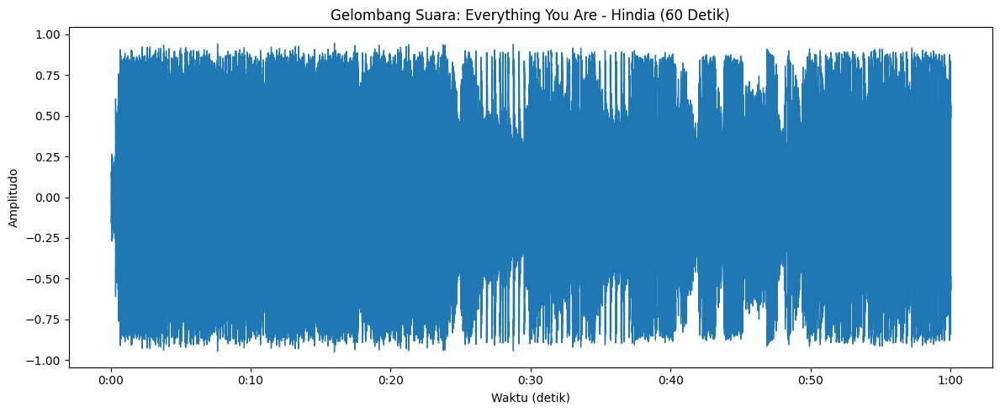

In [ ]:
#visualisasi Gelombang suara

if y is not None and sr is not None:
    plt.figure(figsize=(12, 5))
    librosa.display.waveshow(y, sr=sr)
    plt.title('Gelombang Suara: Everything You Are - Hindia (60 Detik)')
    plt.xlabel('Waktu (detik)')
    plt.ylabel('Amplitudo')
    plt.tight_layout()
    plt.show()
else:
    print(f"Gagal membaca file audio di path: {PATH}")

/tmp/ipython-input-30-3657039989.py:2: UserWarning: PySoundFile failed. Trying audioread instead.
  y, sr = librosa.load(audio_path, sr=None, mono=False)
/usr/local/lib/python3.11/dist-packages/librosa/core/audio.py:184: FutureWarning: librosa.core.audio.__audioread_load
	Deprecated as of librosa version 0.10.0.
	It will be removed in librosa version 1.0.
  y, sr_native = __audioread_load(path, offset, duration, dtype)


Shape array audio: (2, 2646016)
Sample rate: 44100


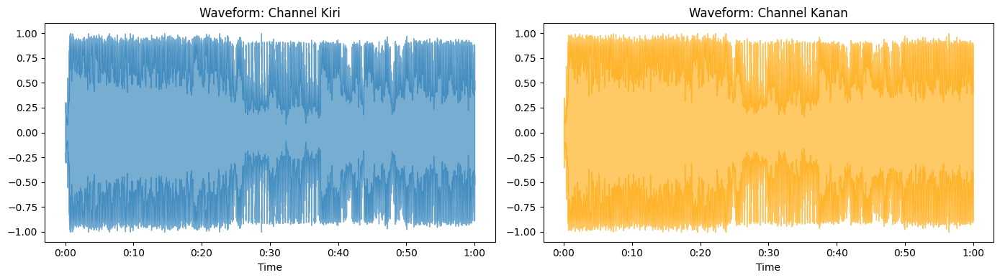

In [ ]:

audio_path = PATH
y, sr = librosa.load(audio_path, sr=None, mono=False)

print("Shape array audio:", y.shape)
print("Sample rate:", sr)
plt.figure(figsize=(14, 4))

if y.ndim == 1:
    # Mono audio
    librosa.display.waveshow(y, sr=sr)
    plt.title("Waveform: Mono")
else:
    # Stereo audio (2 channel)
    plt.subplot(1, 2, 1)
    librosa.display.waveshow(y[0], sr=sr, alpha=0.6)
    plt.title("Waveform: Channel Kiri")

    plt.subplot(1, 2, 2)
    librosa.display.waveshow(y[1], sr=sr, alpha=0.6, color='orange')
    plt.title("Waveform: Channel Kanan")

plt.tight_layout()
plt.show()

##Periksa Spectral Leakage

dengan dan tanpa windowing


/tmp/ipython-input-41-1718549502.py:2: UserWarning: PySoundFile failed. Trying audioread instead.
  y, sr = librosa.load(audio_path)
/usr/local/lib/python3.11/dist-packages/librosa/core/audio.py:184: FutureWarning: librosa.core.audio.__audioread_load
	Deprecated as of librosa version 0.10.0.
	It will be removed in librosa version 1.0.
  y, sr_native = __audioread_load(path, offset, duration, dtype)


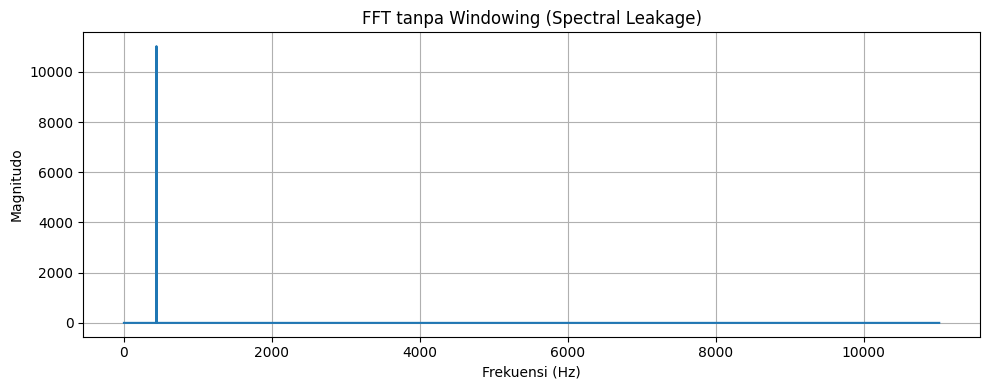

In [ ]:
audio_path = PATH
y, sr = librosa.load(audio_path)
durasi = 1.0
f = 440  # frekuensi (Hz)
t = np.linspace(0, durasi, int(sr * durasi), endpoint=False)
sine_wave = np.sin(2 * np.pi * f * t)

# Hitung FFT tanpa windowing
N = len(sine_wave)
spectrum = np.abs(fft(sine_wave))[:N // 2]
freqs = np.fft.fftfreq(N, 1/sr)[:N // 2]

plt.figure(figsize=(10, 4))
plt.plot(freqs, spectrum)
plt.title('FFT tanpa Windowing (Spectral Leakage)')
plt.xlabel('Frekuensi (Hz)')
plt.ylabel('Magnitudo')
plt.grid()
plt.tight_layout()
plt.show()

In [ ]:
# Terapkan Hamming Window
window = np.hamming(N)
windowed_signal = sine_wave * window

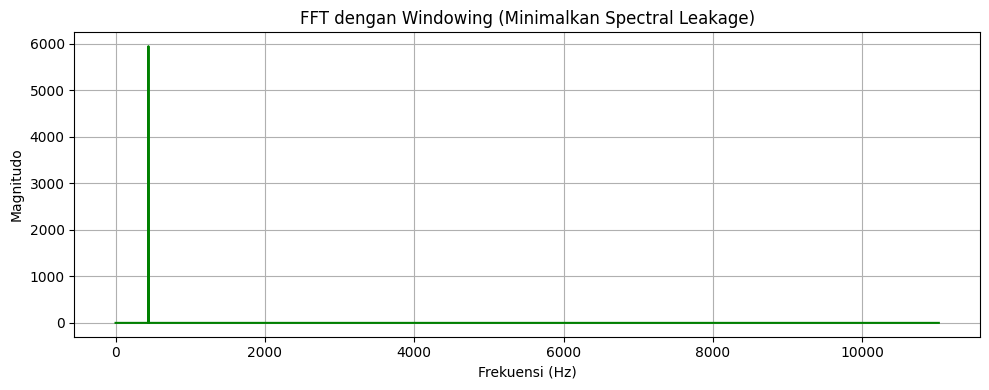

In [ ]:
spectrum_win = np.abs(fft(windowed_signal))[:N // 2]

plt.figure(figsize=(10, 4))
plt.plot(freqs, spectrum_win, label='Dengan Hamming Window', color='green')
plt.title('FFT dengan Windowing (Minimalkan Spectral Leakage)')
plt.xlabel('Frekuensi (Hz)')
plt.ylabel('Magnitudo')
plt.grid()
plt.tight_layout()
plt.show()

##Ekstraksi Fitur

- RMS
- ZCR
- MFCC
- Spectogram
- Beat & Tempo


In [ ]:
#RMS aud
rms = librosa.feature.rms(y=y)[0]

# waktu RMS
frame = range(len(rms))
waktu_rms = librosa.frames_to_time(frame, sr=sr)

print(f"Jumlah frame RMS: {len(rms)}")

Jumlah frame RMS: 2585


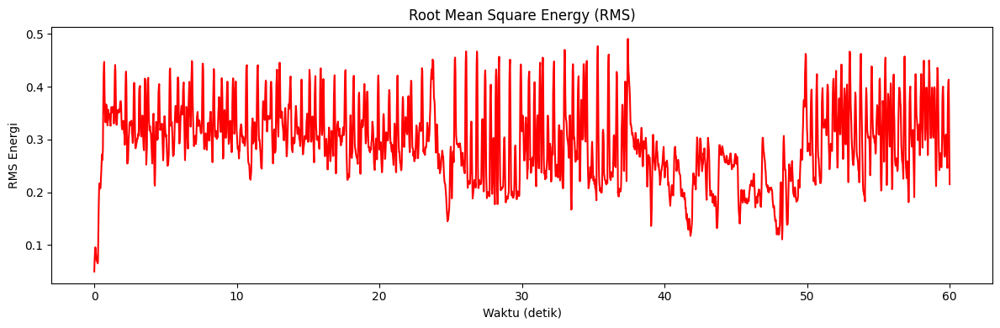

In [ ]:
# visualisasi RMS
plt.figure(figsize=(12, 4))
plt.plot(waktu_rms, rms, color='red')
plt.title('Root Mean Square Energy (RMS)')
plt.xlabel('Waktu (detik)')
plt.ylabel('RMS Energi')
plt.tight_layout()
plt.show()

In [ ]:
#ZCR
zcr = librosa.feature.zero_crossing_rate(y=y)[0]

# Waktu ZCR
frames = range(len(zcr))
times_zcr = librosa.frames_to_time(frames, sr=sr)

print(f"Jumlah frame ZCR: {len(zcr)}")

Jumlah frame ZCR: 2585


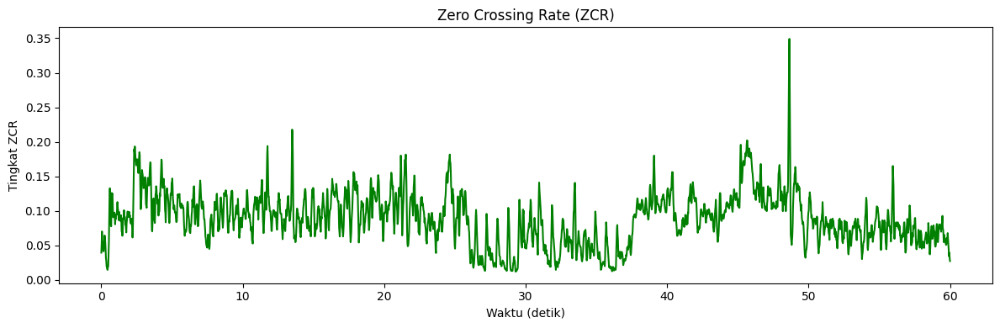

In [ ]:
plt.figure(figsize=(12, 4))
plt.plot(times_zcr, zcr, color='green')
plt.title('Zero Crossing Rate (ZCR)')
plt.xlabel('Waktu (detik)')
plt.ylabel('Tingkat ZCR')
plt.tight_layout()
plt.show()

In [ ]:
#MFCC
mfcc = librosa.feature.mfcc(y=y, sr=sr)

print(f"Bentuk array MFCC: {mfcc.shape}")

Bentuk array MFCC: (20, 2585)


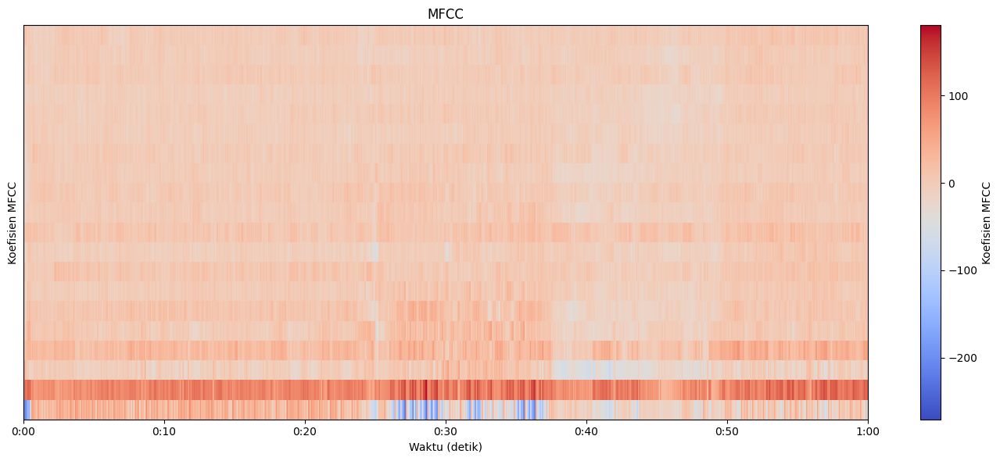

In [ ]:
plt.figure(figsize=(14, 6))
librosa.display.specshow(mfcc, x_axis='time', sr=sr, cmap='coolwarm')
plt.colorbar(label='Koefisien MFCC')
plt.title('MFCC')
plt.xlabel('Waktu (detik)')
plt.ylabel('Koefisien MFCC')
plt.tight_layout()
plt.show()

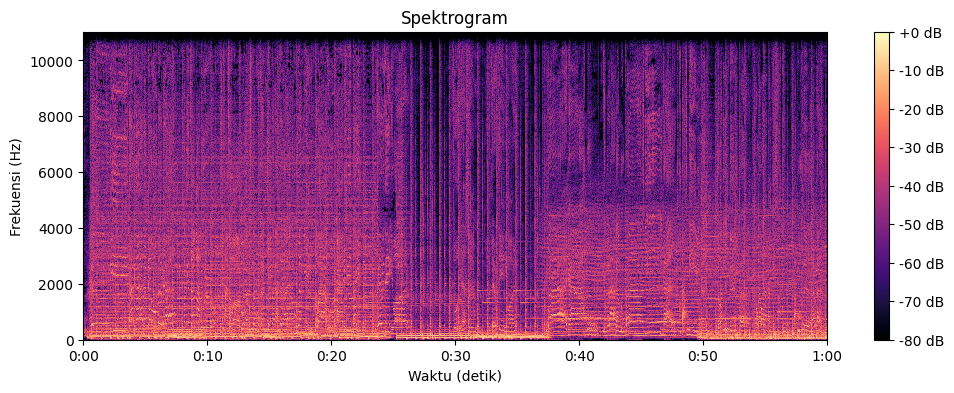

In [ ]:
# Spectogram

D = librosa.stft(y)
S_db = librosa.amplitude_to_db(np.abs(D), ref=np.max)

# Visualisasi Spektogram
plt.figure(figsize=(12, 4))
librosa.display.specshow(S_db, sr=sr, x_axis='time', y_axis='hz')
plt.colorbar(format='%+2.0f dB')
plt.title('Spektrogram')
plt.xlabel('Waktu (detik)')
plt.ylabel('Frekuensi (Hz)')
plt.show()

In [ ]:
#beat & Tempo
tempo, beat_frames = librosa.beat.beat_track(y=y, sr=sr, tightness=100)
beat_times = librosa.frames_to_time(beat_frames, sr=sr)

# Output informasi beat
print(f'Tempo estimasi: {float(tempo):.2f} BPM')
print(f'Jumlah beat terdeteksi: {len(beat_times)}')
print(f'Waktu beat (detik):\n{beat_times}')

#rata rata selisih antar beat
beat_intervals = np.diff(beat_times)
average_interval = np.mean(beat_intervals)
print(f'Rata-rata selisih antar beat: {average_interval:.2f} detik')

Tempo estimasi: 78.30 BPM
Jumlah beat terdeteksi: 48
Waktu beat (detik):
[ 1.06811791  1.85759637  2.62385488  3.39011338  4.15637188  4.92263039
  5.68888889  6.45514739  7.24462585  8.01088435  8.77714286  9.54340136
 10.30965986 11.07591837 11.84217687 12.63165533 13.39791383 14.16417234
 14.90721088 15.69668934 16.46294785 17.20598639 17.99546485 18.76172336
 19.52798186 20.29424036 21.06049887 21.82675737 22.61623583 23.38249433
 24.17197279 24.93823129 25.7044898  26.44752834 27.21378685 28.00326531
 28.76952381 29.53578231 30.30204082 31.09151927 31.83455782 32.62403628
 33.39029478 34.15655329 34.92281179 35.68907029 36.4553288  37.24480726]
Rata-rata selisih antar beat: 0.77 detik


/tmp/ipython-input-51-3401341401.py:6: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print(f'Tempo estimasi: {float(tempo):.2f} BPM')


/tmp/ipython-input-52-3426342517.py:12: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  plt.title(f'Visualisasi Beat (Tempo: {float(tempo):.2f} BPM)')


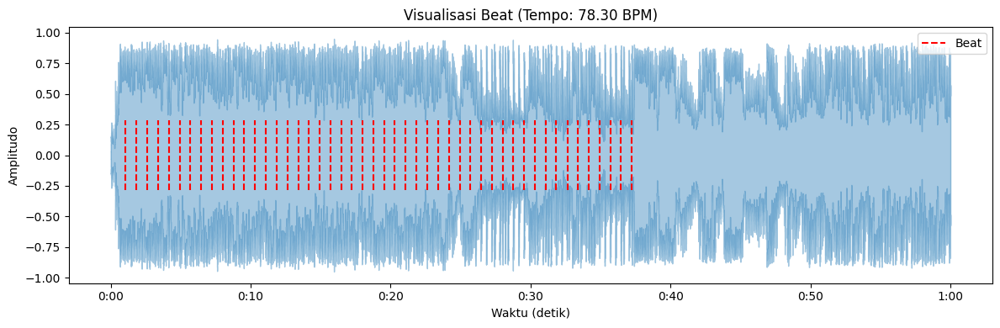

In [ ]:
center_height = 0.3 * np.max(np.abs(y))

plt.figure(figsize=(12, 4))
librosa.display.waveshow(y, sr=sr, alpha=0.4)

plt.vlines(beat_times,
           ymin=-center_height,
           ymax=+center_height,
           color='r', linestyle='--', label='Beat')

plt.legend(loc='upper right')
plt.title(f'Visualisasi Beat (Tempo: {float(tempo):.2f} BPM)')
plt.xlabel('Waktu (detik)')
plt.ylabel('Amplitudo')
plt.tight_layout()
plt.show()


#Normalisasi

referensi : https://medium.com/@poudelnipriyanka/audio-normalization-9dbcedfefcc0

In [ ]:
#konversi ke WAV
audio = AudioSegment.from_file(PATH)

audio.export("everything_u_are_hindia_60scd.wav", format="wav")

<_io.BufferedRandom name='everything_u_are_hindia_60scd.wav'>

In [ ]:
#load wav
y, sr = librosa.load("everything_u_are_hindia_60scd.wav", sr=None)
print(y)

[-7.6293945e-05 -1.8310547e-04 -2.7465820e-04 ...  3.3355713e-02
  6.8023682e-02  7.3806763e-02]


In [ ]:
# #visualisasi waveshow
# plt.figure(figsize=(12, 4))
# librosa.display.waveshow(y, sr=sr)
# plt.title('Waveform')
# plt.xlabel('Waktu (detik)')
# plt.ylabel('Amplitudo')
# plt.tight_layout()
# plt.show()


In [ ]:
wav_path = "everything_u_are_hindia_60scd.wav"
data, rate = sf.read(wav_path)

if len(data.shape) > 1:
    print("Stereo terdeteksi. Mengubah ke mono...")
    data = np.mean(data, axis=1)
    print(data)
else:
  print("File Sudah Mono")
meter = pyln.Meter(rate)
loudness = meter.integrated_loudness(data)
peak = np.max(np.abs(data))

print(f"Loudness awal : {loudness:.2f} LUFS")
print(f"Peak awal     : {peak:.4f}")

Stereo terdeteksi. Mengubah ke mono...
[-7.62939453e-05 -1.83105469e-04 -2.74658203e-04 ...  3.33557129e-02
  6.80236816e-02  7.38067627e-02]
Loudness awal : -11.16 LUFS
Peak awal     : 0.9629


In [ ]:
target_peak_db = -8.0
target_peak_linear = 10 ** (target_peak_db / 20)
gain_peak = target_peak_linear / peak

peak_normalized = data * gain_peak

# Simpan hasilnya
sf.write("/content/audio_peak_normalized.wav", peak_normalized, rate)
print("Peak normalization selesai dan disimpan.")

Peak normalization selesai dan disimpan.


In [ ]:
print("Peak-normalized:")
display(Audio("/content/audio_peak_normalized.wav"))

Peak-normalized:


In [ ]:
target_loudness = -23.0

# Hitung gain loudness
loudness = meter.integrated_loudness(data)
gain_loudness = pyln.normalize.loudness(data, loudness, target_loudness)

sf.write("/content/audio_loudness_normalized.wav", gain_loudness, rate)
print("Loudness normalization selesai dan disimpan.")

Loudness normalization selesai dan disimpan.


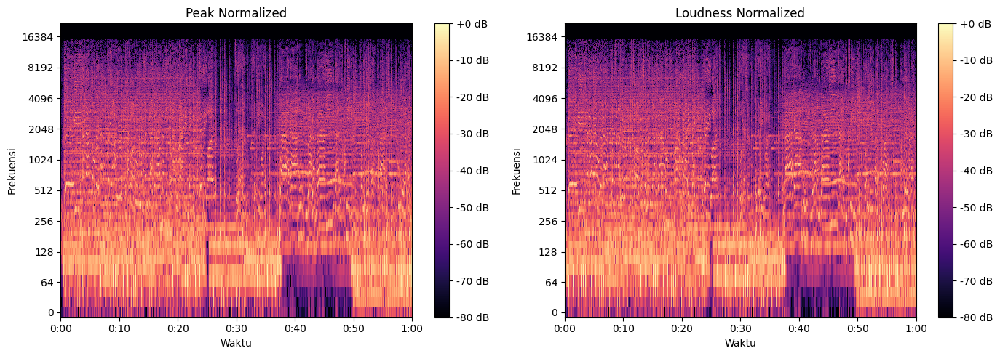

In [ ]:
#spektrum loudness & Peak normalize
# Load audio hasil normalisasi
y_peak, sr = librosa.load("/content/audio_peak_normalized.wav", sr=None)
y_loud, _ = librosa.load("/content/audio_loudness_normalized.wav", sr=None)

# Hitung spektrogram
S_peak = librosa.amplitude_to_db(np.abs(librosa.stft(y_peak)), ref=np.max)
S_loud = librosa.amplitude_to_db(np.abs(librosa.stft(y_loud)), ref=np.max)

# Tampilkan spektrogram
plt.figure(figsize=(14, 5))

# Spektrogram Peak Normalized
plt.subplot(1, 2, 1)
librosa.display.specshow(S_peak, sr=sr, x_axis='time', y_axis='log', cmap='magma')
plt.title("Peak Normalized")
plt.colorbar(format='%+2.0f dB')
plt.xlabel("Waktu")
plt.ylabel("Frekuensi")

# Spektrogram Loudness Normalized
plt.subplot(1, 2, 2)
librosa.display.specshow(S_loud, sr=sr, x_axis='time', y_axis='log', cmap='magma')
plt.title("Loudness Normalized")
plt.colorbar(format='%+2.0f dB')
plt.xlabel("Waktu")
plt.ylabel("Frekuensi")

plt.tight_layout()
plt.show()

In [ ]:
print("Loudness-normalized:")
display(Audio("/content/audio_loudness_normalized.wav"))

Loudness-normalized:


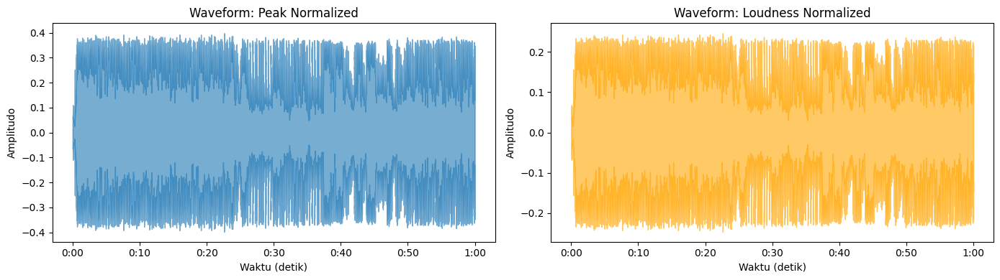

In [ ]:
# Buat plot waveform
plt.figure(figsize=(14, 4))

# Peak Normalized
plt.subplot(1, 2, 1)
librosa.display.waveshow(y_peak, sr=sr, alpha=0.6)
plt.title('Waveform: Peak Normalized')
plt.xlabel('Waktu (detik)')
plt.ylabel('Amplitudo')

# Loudness Normalized
plt.subplot(1, 2, 2)
librosa.display.waveshow(y_loud, sr=sr, alpha=0.6, color='orange')
plt.title('Waveform: Loudness Normalized')
plt.xlabel('Waktu (detik)')
plt.ylabel('Amplitudo')

plt.tight_layout()
plt.show()

In [ ]:
# Beat Detection untuk y_peak
tempo_peak, beat_frames_peak = librosa.beat.beat_track(y=y_peak, sr=sr)
beat_times_peak = librosa.frames_to_time(beat_frames_peak, sr=sr)

#Beat Detection untuk y_loud
tempo_loud, beat_frames_loud = librosa.beat.beat_track(y=y_loud, sr=sr)
beat_times_loud = librosa.frames_to_time(beat_frames_loud, sr=sr)

print(f"Peak Normalized Tempo   : {float(tempo_peak):.2f} BPM")
print(f"Loudness Normalized Tempo: {float(tempo_loud):.2f} BPM")

Peak Normalized Tempo   : 156.61 BPM
Loudness Normalized Tempo: 156.61 BPM


/tmp/ipython-input-64-2376509932.py:9: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print(f"Peak Normalized Tempo   : {float(tempo_peak):.2f} BPM")
/tmp/ipython-input-64-2376509932.py:10: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print(f"Loudness Normalized Tempo: {float(tempo_loud):.2f} BPM")


/tmp/ipython-input-65-1846393762.py:7: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  plt.title(f'Peak Normalized (Tempo: {float(tempo_peak):.2f} BPM)')
/tmp/ipython-input-65-1846393762.py:16: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  plt.title(f'Loudness Normalized (Tempo: {float(tempo_loud):.2f} BPM)')


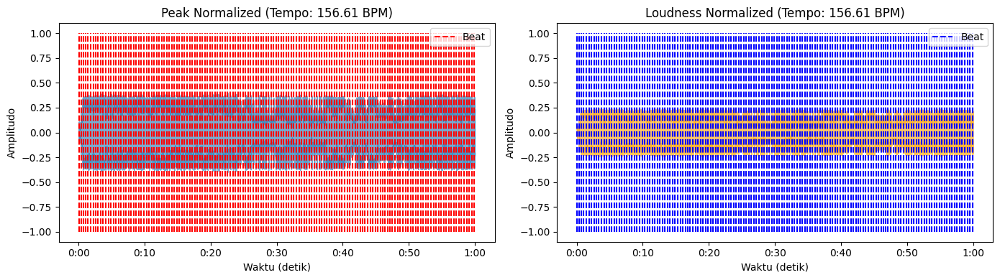

In [ ]:
plt.figure(figsize=(14, 4))

# --- Peak Normalized ---
plt.subplot(1, 2, 1)
librosa.display.waveshow(y_peak, sr=sr, alpha=0.6)
plt.vlines(beat_times_peak, ymin=-1, ymax=1, color='red', linestyle='--', label='Beat')
plt.title(f'Peak Normalized (Tempo: {float(tempo_peak):.2f} BPM)')
plt.xlabel('Waktu (detik)')
plt.ylabel('Amplitudo')
plt.legend()

# --- Loudness Normalized ---
plt.subplot(1, 2, 2)
librosa.display.waveshow(y_loud, sr=sr, alpha=0.6, color='orange')
plt.vlines(beat_times_loud, ymin=-1, ymax=1, color='blue', linestyle='--', label='Beat')
plt.title(f'Loudness Normalized (Tempo: {float(tempo_loud):.2f} BPM)')
plt.xlabel('Waktu (detik)')
plt.ylabel('Amplitudo')
plt.legend()

plt.tight_layout()
plt.show()
